<a href="https://colab.research.google.com/github/tmrb/machine_learning_project/blob/master/Auto_sklearn.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Auto-Sklearn

auto-sklearn is an automated machine learning toolkit and a drop-in replacement for a scikit-learn estimator.
It frees a machine learning user from algorithm selection and hyperparameter tuning. It leverages recent advantages in Bayesian optimization, meta-learning and ensemble construction.

[Docu](https://automl.github.io/auto-sklearn/master/),
[Paper](https://papers.nips.cc/paper/5872-efficient-and-robust-automated-machine-learning)

Notebook author: Marius Lindauer ([www.automl.org](https://www.automl.org))

# Installation

The notebook was created based on 
scikit-learn 0.19.2, smac 0.8.0 and auto-sklearn 0.5.1.

In [ ]:
!apt-get install swig -y
!pip install Cython numpy

# sometimes you have to run the next command twice on colab
# I haven't figured out why
!pip install auto-sklearn==0.10.0
#!pip install <auto-sklearn>=<0.10.0>
!pip install pipelineprofiler
!pip install skater

Reading package lists... Done
Building dependency tree       
Reading state information... Done
The following additional packages will be installed:
  swig3.0
Suggested packages:
  swig-doc swig-examples swig3.0-examples swig3.0-doc
The following NEW packages will be installed:
  swig swig3.0
0 upgraded, 2 newly installed, 0 to remove and 15 not upgraded.
Need to get 1,100 kB of archives.
After this operation, 5,822 kB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu bionic/universe amd64 swig3.0 amd64 3.0.12-1 [1,094 kB]
Get:2 http://archive.ubuntu.com/ubuntu bionic/universe amd64 swig amd64 3.0.12-1 [6,460 B]
Fetched 1,100 kB in 1s (1,203 kB/s)
Selecting previously unselected package swig3.0.
(Reading database ... 146442 files and directories currently installed.)
Preparing to unpack .../swig3.0_3.0.12-1_amd64.deb ...
Unpacking swig3.0 (3.0.12-1) ...
Selecting previously unselected package swig.
Preparing to unpack .../swig_3.0.12-1_amd64.deb ...
Unpackin

     |████████████████████████████████| 880kB 4.2MB/s 
     |████████████████████████████████| 102kB 3.9MB/s 
     |████████████████████████████████| 25.3MB 191kB/s 
     |████████████████████████████████| 256kB 36.3MB/s 
     |████████████████████████████████| 174kB 49.5MB/s 
     |████████████████████████████████| 184kB 45.5MB/s 
     |████████████████████████████████| 133kB 45.4MB/s 
  ERROR: Failed building wheel for skater
  Running setup.py clean for skater
  Created wheel for ds-lime: filename=ds_lime-0.1.1.27-cp36-none-any.whl size=261596 sha256=0dcdd3adb870d86736d2bae1e0674f8859774761241675cdc30a665e3e57709e
  Stored in directory: /root/.cache/pip/wheels/d2/d4/1a/aea47d52f483349f78aa13ba18adaa5ca69f3c68da0ecb859a
  Created wheel for wordcloud: filename=wordcloud-1.3.1-cp36-cp36m-linux_x86_64.whl size=281723 sha256=067dd5178980326bd897b1e962d5f77d6fff1eb13ba586dde2abb26a6a9a3618
  Stored in directory: /root/.cache/pip/wheels/4a/36/e1/1ba3d735db8ffb1eb276d30f22c406105598cbfb345d

In [ ]:
from google.colab import drive
import sys
drive.mount("/content/drive", force_remount=True)
root  = '/content/drive/My Drive/projeto'
sys.path.append(root)

Mounted at /content/drive


In [ ]:
# ignore some annoying warnings for demonstrating auto-sklearn 
# shouldn't be done in real production
import numpy as np
np.warnings.filterwarnings('ignore')

In [ ]:
import pandas as pd

train_new = pd.read_csv('/content/drive/My Drive/projeto/overallprocessed_automl.csv',sep = ',', decimal='.')
#train_new.drop(columns = [	'Unnamed: 0',	'Análise',	'Data',	'Campanha_x',	'Máquina_x',	'Lote','Analista',	'Responsável',	'Observações da Produção',	'01 - Resistencia a Ruptura //','02 - Resistencia a Ruptura _/',	'03 - Alongamento na Ruptura //',	'04 - Alongamento na Ruptura _/',	'05 - Modulo de Elasticidade //',	'06 - Modulo de Elasticidade _/',	'07 - Haze',	'08 - Retração // a 150°C',	'09 - Retração _/ a 150°C',	'10 - Atrito Estatico (A/B)',	'11 - Atrito Dinamico (A/B)',	'12 - Espessura Media Pesada',	'13 - Selagem (valor pico)',	'14 - Atrito Estatico Fnt/Fnt',	'15 - Atrito Dinamico Fnt/Fnt',	'16 - Tensao Superficial FT',	'17 - Gramatura do coating',	'18 - TPO2',	'19 - TPVA',	'20 - Tensao superficial FNT',	'21 - Retração // a 200°C',	'22 - Retração _/ a 200°C',	'23 - Rugosidade Ra (FT)',	'24 - Rugosidade Rz (FT)',	'25 - Rugosidade Rt (FT)',	'26 - DESAERACAO (FT)',	'27 - Adesão ao metal 121°C',	'28 - Rendimento','29 - Atrito Estatico Ft/Ft',	'30 - Atrito Dinamico Ft/Ft',	'31 - Forca de Release',	'32 - Retirada de aluminio',	'33 - Desaeração FNT',	'34 - Retrato // 150c,15 min',	'35 - Retrato _/ 150C, 15 min',	'36 - % Transmissão a 330 nm',	'37 - Densidade ótica',	'38 - Rugosidade Ra - FNT',	'39 - Rugosidade Rz - FNT',	'40 - Rugosidade Rt - FNT',	'41 - IV',	'42 - Rigidez dieletrica',	'43 - Tensao superficial Face corona',	'44 - Selagem Q/Q',	'45 - Selagem IC/IC',	'46 - Selagem PVDC/PVDC',	'47 - Selagem IC/Q',	'48 - Gramatura',	'49 - Tensão a 5% //',	'50 - Tensão a 5% _/',	'51 - Transmissão de Luz (Hazímetro)',	'52 - Brilho 60°',	'53 - Indice de Cristalização PVDC',	'54 - Densidade Ótica a 555 nm', '55 - Listras ou falhas no coating',	'56 - Tratamento conforme',	'57 - TPO2.',	'58 - Aspecto Visual',	'59 - Selagem PVDC/PVDC',	'60 - Alongamento na Ruptura 45°',	'61 - Alongamento na Ruptura 135°',	'62 - Resistencia a Ruptura 45°',	'63 - Resistencia a Ruptura 135°',	'64 - DELTA Alongamento (45° - 135°)',	'65 - Resistividade'])
train_new = train_new.dropna(axis=1, how = 'all')
train_new = train_new.drop_duplicates()
train_new = train_new.drop(columns=['Unnamed: 0'])
#train_new = train_new.interpolate(axis=1)
y = train_new['Situação']
X = train_new.drop(columns=['Situação'])

In [ ]:
import sklearn.model_selection
import sklearn.datasets
import sklearn.metrics

# Load data
#X, y = sklearn.datasets.load_digits(return_X_y=True)
X_train, X_test, y_train, y_test = \
        sklearn.model_selection.train_test_split(X, y, random_state=1, stratify = y)

The accuracy might not be quite state-of-the-art after running auto-sklearn only for two minutes. If you want to achieve better results, please try to increase the time limit `time_left_for_this_task`.

In [ ]:
import autosklearn.classification

# configure auto-sklearn
automl = autosklearn.classification.AutoSklearnClassifier(
          time_left_for_this_task=300, # run auto-sklearn for at most 2min
          per_run_time_limit=30, # spend at most 30 sec for each model training
          )

# train model(s)
automl.fit(X_train,y_train)

# evaluate
y_hat = automl.predict(X_test)
test_acc = sklearn.metrics.accuracy_score(y_test, y_hat)
print("Test Accuracy score {0}".format(test_acc))

Test Accuracy score 0.8467741935483871


## Inspect some statistics of our first example

Please note that auto-sklearn has internally used a holdout set of the traning set to estimate the quality of the trained model. Based on this hold-out validation set, auto-sklearn reports a validation score.

In [ ]:
print(automl.sprint_statistics())
#print(automl_ensembles.sprint_statistics())

auto-sklearn results:
  Dataset name: 4e1cf69b38ba8dd52073e7c6f5315d6e
  Metric: accuracy
  Best validation score: 0.853659
  Number of target algorithm runs: 79
  Number of successful target algorithm runs: 74
  Number of crashed target algorithm runs: 5
  Number of target algorithms that exceeded the time limit: 0
  Number of target algorithms that exceeded the memory limit: 0



## Inspect Ensemble

Auto-sklearn considers all trained models as potential candidates to build an ensemble out of these.
The following command allows you to see the ensemble.

Since the ensemble does not use a simple majority voting, but a weighted ensemble,
the fomat is the following:

`(ensemble weight, machine learning pipeline)`

In [ ]:
print(automl.show_models())
#print(automl_ensembles.show_models())

[(0.340000, SimpleClassificationPipeline({'balancing:strategy': 'weighting', 'classifier:__choice__': 'lda', 'data_preprocessing:categorical_transformer:categorical_encoding:__choice__': 'one_hot_encoding', 'data_preprocessing:categorical_transformer:category_coalescence:__choice__': 'minority_coalescer', 'data_preprocessing:numerical_transformer:imputation:strategy': 'mean', 'data_preprocessing:numerical_transformer:rescaling:__choice__': 'minmax', 'feature_preprocessor:__choice__': 'nystroem_sampler', 'classifier:lda:n_components': 220, 'classifier:lda:shrinkage': 'auto', 'classifier:lda:tol': 0.0013824567992319003, 'data_preprocessing:categorical_transformer:category_coalescence:minority_coalescer:minimum_fraction': 0.00021328932075284388, 'feature_preprocessor:nystroem_sampler:kernel': 'sigmoid', 'feature_preprocessor:nystroem_sampler:n_components': 295, 'feature_preprocessor:nystroem_sampler:coef0': 0.039972474835314076, 'feature_preprocessor:nystroem_sampler:gamma': 0.01017810882

In [ ]:
automl.sprint_statistics()

'auto-sklearn results:\n  Dataset name: 4e1cf69b38ba8dd52073e7c6f5315d6e\n  Metric: accuracy\n  Best validation score: 0.853659\n  Number of target algorithm runs: 79\n  Number of successful target algorithm runs: 74\n  Number of crashed target algorithm runs: 5\n  Number of target algorithms that exceeded the time limit: 0\n  Number of target algorithms that exceeded the memory limit: 0\n'

In [ ]:
import PipelineProfiler
from random import seed
seed(1)
data = PipelineProfiler.import_autosklearn(automl)
PipelineProfiler.plot_pipeline_matrix(data[0:15])


In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.linear_model import PassiveAggressiveClassifier
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis as LDA
from sklearn.discriminant_analysis import QuadraticDiscriminantAnalysis as QDA
from sklearn.naive_bayes import BernoulliNB

In [ ]:
RandomForest1 = RandomForestClassifier(bootstrap=True,criterion='gini', max_features=0.50, max_leaf_nodes= None,
                                       min_impurity_decrease = 0,min_samples_leaf=1,min_samples_split=2,min_weight_fraction_leaf=0)
RandomForest2 = RandomForestClassifier(bootstrap=False,criterion='gini', max_features=0.33, max_leaf_nodes= None,
                                       min_impurity_decrease = 0,min_samples_leaf=1,min_samples_split=3,min_weight_fraction_leaf=0)
RandomForest3 = RandomForestClassifier(bootstrap=True,criterion='gini', max_features=0.12, max_leaf_nodes= None,
                                       min_impurity_decrease = 0,min_samples_leaf=12,min_samples_split=9,min_weight_fraction_leaf=0)
SVClassifier1 = SVC(C = 940.94, gamma=1.58, kernel='rbf', max_iter=-1, shrinking= False, tol=0.02,probability= True)
SVClassifier2= SVC(C = 8.61,coef0=0.51, kernel='rbf', max_iter=-1, shrinking= False, tol=0.02,probability= True)
LDAClassifier = LDA(n_components=224)
QDAClassifier1 = QDA(reg_param=0.83)
QDAClassifier2 = QDA(reg_param=0.87)
PAClassifier = PassiveAggressiveClassifier()
BernNBClassifier1 = BernoulliNB(alpha=7.81,fit_prior=True)
BernNBClassifier2 = BernoulliNB(alpha=0.49,fit_prior=True)

In [ ]:
from sklearn.metrics import f1_score,accuracy_score, average_precision_score,log_loss, recall_score, brier_score_loss, jaccard_score, roc_auc_score
from sklearn.metrics import matthews_corrcoef
from random import seed

seed(3)

models = {          'RF1': RandomForest1,
          'RF2': RandomForest2,
          'RF3': RandomForest3,
          'SVC1':SVClassifier1,
          'SVC2':SVClassifier1,
          'LDA': LDAClassifier,
          'QDA1': QDAClassifier1,
          'QDA2': QDAClassifier2,
          'BNB1': BernNBClassifier1,
          'BNB2': BernNBClassifier2}
f1 = {}
accuracy = {}
matthews = {}
average_precision = {}
brier_loss_ = {}
recall_ = {}
jaccard_ = {}
AUC = {}
results = pd.DataFrame()
for model_key in models:
  model = models[model_key]
  model.fit(X_train, y_train)
  preds = model.predict(X_test)
  f1[model_key] = f1_score(y_test, preds)
  accuracy[model_key] = accuracy_score(y_test, preds)
  matthews[model_key] = matthews_corrcoef(y_test,preds)
  average_precision[model_key] = average_precision_score(y_test,preds)
  brier_loss_[model_key] = brier_score_loss(y_test,preds)
  recall_[model_key] = recall_score(y_test,preds)
  jaccard_[model_key] = jaccard_score(y_test,preds)
  AUC[model_key] = roc_auc_score(y_test,preds)
  y_pred = models[model_key].predict_proba(X_test)[:,1]
  if f1[model_key] < 0 :
    f1[model_key] = 0
  if accuracy[model_key] < 0 :
    accuracy[model_key] = 0
  if matthews[model_key] < 0 :
    matthews[model_key] = 0
  # Save results in pandas dataframe object
  results[f"{model_key}"] = y_pred
  print("F1 for {0}: {1}".format(model_key, f1[model_key]))
  print("accuracy for {0}: {1}".format(model_key, accuracy[model_key]))
  print("Matthews correlation coef for {0}: {1}".format(model_key, matthews[model_key]))
  print("Average precision for {0}: {1}".format(model_key, average_precision[model_key]))
  print("Log loss for {0}: {1}".format(model_key, brier_loss_[model_key]))
  print("Recall for {0}: {1}".format(model_key, recall_[model_key]))
  print("Jaccard for {0}: {1}".format(model_key, jaccard_[model_key]))
  results['Situacao'] = y_test.values

F1 for RF1: 0.9026548672566371
accuracy for RF1: 0.8225806451612904
Matthews correlation coef for RF1: 0
Average precision for RF1: 0.8430837490954792
Log loss for RF1: 0.1774193548387097
Recall for RF1: 0.9714285714285714
Jaccard for RF1: 0.8225806451612904
F1 for RF2: 0.9058295964125561
accuracy for RF2: 0.8306451612903226
Matthews correlation coef for RF2: 0.11275004386442852
Average precision for RF2: 0.8555833268244423
Log loss for RF2: 0.1693548387096774
Recall for RF2: 0.9619047619047619
Jaccard for RF2: 0.8278688524590164
F1 for RF3: 0.9170305676855895
accuracy for RF3: 0.8467741935483871
Matthews correlation coef for RF3: 0.0
Average precision for RF3: 0.8467741935483871
Log loss for RF3: 0.1532258064516129
Recall for RF3: 1.0
Jaccard for RF3: 0.8467741935483871
F1 for SVC1: 0.9122807017543859
accuracy for SVC1: 0.8387096774193549
Matthews correlation coef for SVC1: 0
Average precision for SVC1: 0.8455403194584942
Log loss for SVC1: 0.16129032258064516
Recall for SVC1: 0.99047

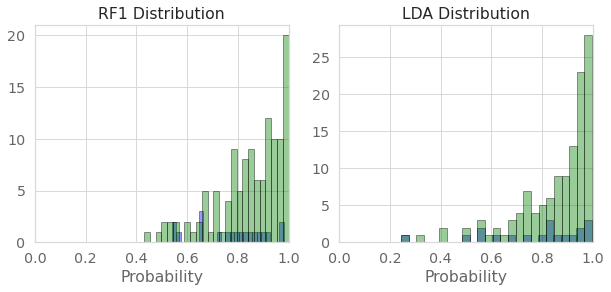

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import roc_auc_score

sns.set(font_scale = 1.3)
sns.set_style({"axes.facecolor": "1.0", "axes.edgecolor": "0.85", "grid.color": "0.85",
               "grid.linestyle": "-", 'axes.labelcolor': '0.4', "xtick.color": "0.4",
               'ytick.color': '0.4'})

# Plot
def probabilities_plot():
  f, ax = plt.subplots(figsize=(10, 4), nrows=1, ncols = 2)
  models_selected = ['RF1','LDA']
  for key, counter in zip(models_selected, range(2)):
    # Get predictions
    y_pred = results[key]
    
    # Get AUC
    auc = roc_auc_score(y_test, y_pred)
    textstr = f"AUC: {auc:.3f}"
    AUC[key] = auc
    #plt.figure(dpi = 600)

    # Plot false distribution
    false_pred = results[results['Situacao'] == 0]
    sns.distplot(false_pred[key], hist=True, kde=False, 
                bins=int(25), color = 'blue',
                hist_kws={'edgecolor':'black'}, ax = ax[counter],)
    
    # Plot true distribution
    true_pred = results[results['Situacao'] == 1]
    sns.distplot(results[key], hist=True, kde=False, 
                bins=int(25), color = 'green',
                hist_kws={'edgecolor':'black'}, ax = ax[counter])
    
    
    # These are matplotlib.patch.Patch properties
    props = dict(boxstyle='round', facecolor='white', alpha=0.5)
    
    # Place a text box in upper left in axes coords
    #ax[counter].text(0.05, 0.95, textstr, transform=ax[counter].transAxes, fontsize=14,
    #               verticalalignment = "top", bbox=props)
    
    # Set axis limits and labels
    ax[counter].set_title(f"{key} Distribution")
    ax[counter].set_xlim(0,1)
    ax[counter].set_xlabel("Probability")
  # Tight layout
    plt.savefig('probability_distribution', dpi=600)
  #plt.savefig('Probability.png')
probabilities_plot()

# Libraries
import matplotlib.pyplot as plt
import pandas as pd
from math import pi
 
# Set data
df = pd.DataFrame({
'indice': [0,1,2,3,4,5,6,7,8,9],
'group': ['RF1','RF2','RF3','SVC1','SVC2','LDA','QDA1','QDA2','BNB1','BNB2'],
'f1': [f1['RF1'], f1['RF2'],f1['RF3'],f1['SVC1'],f1['SVC2'],f1['LDA'],f1['QDA1'],f1['QDA2'],f1['BNB1'],f1['BNB2']],
'accuracy': [accuracy['RF1'], accuracy['RF2'],accuracy['RF3'],accuracy['SVC1'],accuracy['SVC2'],accuracy['LDA'],accuracy['QDA1'],accuracy['QDA2'],accuracy['BNB1'],accuracy['BNB2']],
'matthews': [matthews['RF1'], matthews['RF2'],matthews['RF3'],matthews['SVC1'],matthews['SVC2'],matthews['LDA'],matthews['QDA1'],matthews['QDA2'],matthews['BNB1'],matthews['BNB2']],
'AUC': [AUC['RF1'], AUC['RF2'], AUC['RF3'], AUC['SVC1'],AUC['SVC2'],AUC['LDA'],AUC['QDA1'],AUC['QDA2'],AUC['BNB1'],AUC['BNB2']],
'average_precision':[average_precision['RF1'], average_precision['RF2'],average_precision['RF3'],average_precision['SVC1'],average_precision['SVC2'],average_precision['LDA'],average_precision['QDA1'],average_precision['QDA2'],average_precision['BNB1'],average_precision['BNB2']],
'brier_loss_' :[brier_loss_['RF1'], brier_loss_['RF2'],brier_loss_['RF3'],brier_loss_['SVC1'],brier_loss_['SVC2'],brier_loss_['LDA'],brier_loss_['QDA1'],brier_loss_['QDA2'],brier_loss_['BNB1'],brier_loss_['BNB2']],
'recall_' : [recall_['RF1'], recall_['RF2'],recall_['RF3'],recall_['SVC1'],recall_['SVC2'],recall_['LDA'],recall_['QDA1'],recall_['QDA2'],recall_['BNB1'],recall_['BNB2']],
'jaccard_' : [jaccard_['RF1'], jaccard_['RF2'],jaccard_['RF3'],jaccard_['SVC1'],jaccard_['SVC2'],jaccard_['LDA'],jaccard_['QDA1'],jaccard_['QDA2'],jaccard_['BNB1'],jaccard_['BNB2']]
})
 
# ------- PART 1: Create background
def plot_performance(): 
  # number of variable
  categories=list(df)[1:]
  N = len(categories)
  
  # What will be the angle of each axis in the plot? (we divide the plot / number of variable)
  angles = [n / float(N) * 2 * pi for n in range(N)]
  angles += angles[:1]
  
  # Initialise the spider plot
  ax = plt.subplot(111, polar=True)
  
  # If you want the first axis to be on top:
  ax.set_theta_offset(pi / 2)
  ax.set_theta_direction(-1)
  
  # Draw one axe per variable + add labels labels yet
  plt.xticks(angles[:-1], categories)
  
  # Draw ylabels
  ax.set_rlabel_position(0)
  plt.yticks([0.25,0.50,0.75,1.0], ["0.25","0.50","0.75", "1.0"], color="black", size=20)
  plt.ylim(0,1)
  
  
  # ------- PART 2: Add plots
  
  # Plot each individual = each line of the data
  # I don't do a loop, because plotting more than 3 groups makes the chart unreadable
  
  # Ind1
  values=df.loc[0].drop('group').values.flatten().tolist()
  values += values[:1]
  ax.plot(angles, values, linewidth=2, linestyle='solid', label="SVC")
  ax.fill(angles, values, 'b', alpha=0.1)

  # Ind4
  values=df.loc[3].drop('group').values.flatten().tolist()
  values += values[:1]
  ax.plot(angles, values, linewidth=2, linestyle='solid', label="RF")
  ax.fill(angles, values, 'r', alpha=0.2)
  
  # Add legend
  plt.legend(loc='upper right', bbox_to_anchor=(0.1, 0.1))
plt.savefig('probability_distribution', dpi=600)

#plot_performance()

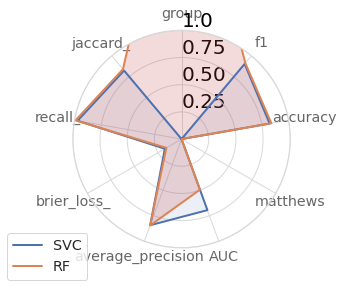

In [ ]:
plot_performance()

2021-02-09 00:02:59,540 - skater.core.explanations - WARNING - Progress bars slow down runs by 10-20%. For slightly 
faster runs, do progress_bar=False


[24/24] features ████████████████████ Time elapsed: 3 seconds

2021-02-09 00:03:03,730 - skater.core.explanations - WARNING - Progress bars slow down runs by 10-20%. For slightly 
faster runs, do progress_bar=False


[24/24] features ████████████████████ Time elapsed: 2 seconds

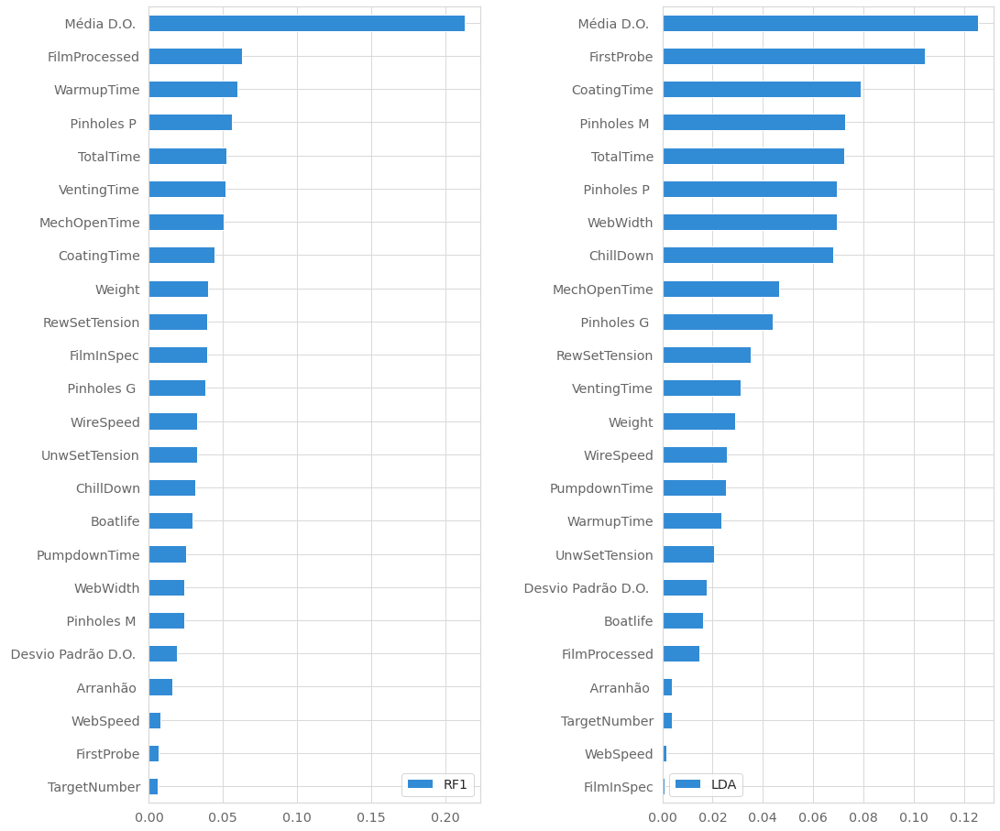

In [ ]:
%matplotlib inline
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import skater
from skater.core.explanations import Interpretation
from skater.model import InMemoryModel
from skater.core.local_interpretation.lime.lime_tabular import LimeTabularExplainer

ax, axes = plt.subplots(1,2, figsize = (16, 16))
plt.subplots_adjust(left=0.1,wspace=0.55)

ax_dict = {
    'RF1':axes[0],
    'LDA':axes[1]
}
labels = list(ax_dict.keys())
data = np.array(list(ax_dict.values()))
category_colors = plt.get_cmap('RdYlGn')(np.linspace(1, 2, data.shape[0]))

interpreter = Interpretation(X_train, feature_names=X_train)
from matplotlib.pyplot import colorbar
models_selection = ['RF1','LDA']

for model_key in models_selection:
  pyint_model = InMemoryModel(models[model_key].predict_proba, examples=X_train,target_names=True)
  ax = ax_dict[model_key]
  values = interpreter.feature_importance.plot_feature_importance(pyint_model, ax=ax, ascending = True)
  ax.legend([model_key])
  
#for tick in ax.yaxis.get_major_ticks():
#    tick.label.set_fontsize(20) 
#for tick in ax.xaxis.get_major_ticks():
#    tick.label.set_fontsize(15)
#plt.yticks(fontsize =20)
#plt.xticks(fontsize =15)
ax.plot(dpi = 600)

ax.figure.savefig('features_importance.png', dpi = 600)


In [ ]:
!pip install shap

     |████████████████████████████████| 358kB 6.3MB/s 
  Created wheel for shap: filename=shap-0.38.1-cp36-cp36m-linux_x86_64.whl size=489391 sha256=e3d32830373c5e41c698fbc401486522f2d26742b64912b5c77f242a64ebbc7c
  Stored in directory: /root/.cache/pip/wheels/a8/fb/e4/88012be41842b9be62ae18d82d1b1e880daf8539d1fef1fa00
Successfully built shap


In [ ]:
import shap


# load JS visualization code to notebook
shap.initjs()
model = RandomForest1.fit(X_train,y_train)
explainer = shap.TreeExplainer(model)
shap_values = explainer.shap_values(X_train)
# visualize the first prediction's explanation (use matplotlib=True to avoid Javascript)
shap.force_plot(explainer.expected_value[1], shap_values[1], X_train, show=False)

In [ ]:
import plotly.express as px
import plotly
import param
import panel as pn
import json

class RatingsDashboard(param.Parameterized):
  def probabilites_plot(self):
    ax = probabilities_plot()
    plt.close()
    return ax

  def performance_plot(self):
    ax = plot_performance()
    plt.close()
    return ax

  def dispersion_plot(self):
    return shap.summary_plot(shap_values[0],X_train,plot_type='dot',class_names=['Aprovado'])

  def predictions_plot(self):
    ax =  shap.force_plot(explainer.expected_value[1], shap_values[0], X_train, matplotlib= False)
    return ax
  
  def parallel_plot(self):
    ax = px.parallel_coordinates(X, color = X[' Média D.O. '],dimensions = ['ChillDown','CoatingTime','VentingTime','WarmupTime','WireSpeed'],width = 1000)
    return ax
                          
  def example_explainer(self):
    exp = LimeTabularExplainer(X_train.values, 
                           feature_names=X.columns, 
                           discretize_continuous=True, 
                           class_names=['Disapproved', 'Approved'])
    return exp.explain_instance(X_train.iloc[0].values, models['RF1'].predict_proba).show_in_notebook()

rd = RatingsDashboard()
pn.extension()

In [ ]:
fig = rd.parallel_plot()
fig.show()

In [ ]:
!pip install kaleido

     |████████████████████████████████| 74.6MB 120kB/s 


In [ ]:
from kaleido.scopes.plotly import PlotlyScope
import plotly.graph_objects as go
scope = PlotlyScope()

with open("figure.png", "wb") as f:
    f.write(scope.transform(fig, format="png"))

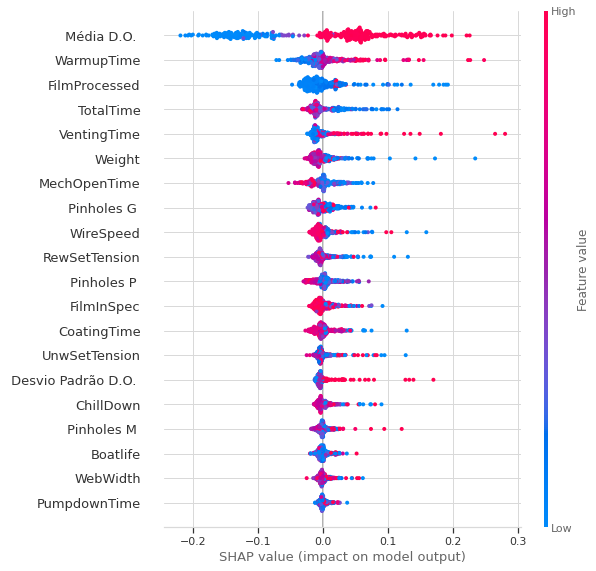

In [ ]:
rd.dispersion_plot()
plt.savefig("dispersion.png")

In [ ]:
def example_explainer():
    exp = LimeTabularExplainer(X_train.values, 
                           feature_names=X.columns, 
                           discretize_continuous=True, 
                           class_names=['Disapproved', 'Approved'], verbose = True)
    
    return exp

In [ ]:
fig = rd.example_explainer()
#fig.explain_instance(X_test.iloc[2].values, models['RF1'].predict_proba).show_in_notebook()

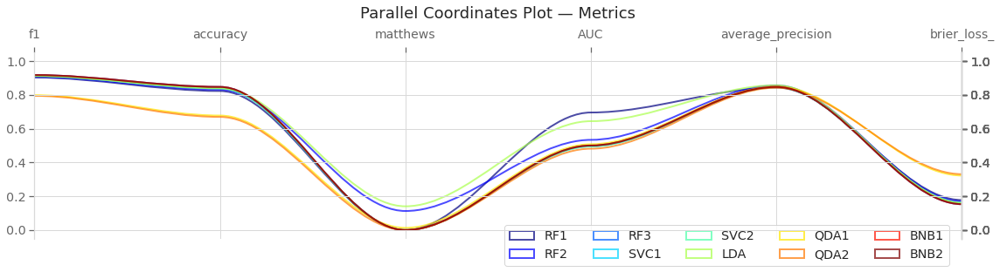

In [ ]:
import matplotlib.pyplot as plt
from matplotlib.path import Path
import matplotlib.patches as patches
import matplotlib.colors as colors
import numpy as np
from sklearn import datasets
#iris = datasets.load_iris()
iris = df.drop(columns=['indice','group'])
ynames = iris.columns
ys = iris.values
ymins = 0
ymaxs = np.ones((ys.shape[1],))
dys = ymaxs - ymins
ymins -= dys * 0.05  # add 5% padding below and above
ymaxs += dys * 0.05

#ymaxs[1], ymins[1] = ymins[1], ymaxs[1]  # reverse axis 1 to have less crossings
dys = ymaxs - ymins

# transform all data to be compatible with the main axis
zs = np.zeros_like(ys)
zs[:, 0] = ys[:, 0]
zs[:, 1:] = (ys[:, 1:] - ymins[1:]) / dys[1:] * dys[0] + ymins[0]

fig, host = plt.subplots(figsize=(16,4))

axes = [host] + [host.twinx() for i in range(ys.shape[1] - 1)]
for i, ax in enumerate(axes):
    ax.set_ylim(ymins[i], ymaxs[i])
    ax.spines['top'].set_visible(False)
    ax.spines['bottom'].set_visible(False)
    if ax != host:
        ax.spines['left'].set_visible(False)
        ax.yaxis.set_ticks_position('right')
        ax.spines["right"].set_position(('axes',1))
        #ax.spines['right'].set_visible(False)

#host.set_xlim(0, ys.shape[0])
host.set_xticks(range(ys.shape[1]-2))
host.set_xticklabels(ynames, fontsize=14)
host.tick_params(axis='x', which='major', pad=7)
host.spines['right'].set_visible(False)
host.xaxis.tick_top()
host.set_title('Parallel Coordinates Plot — Metrics', fontsize=18, pad=12)
values = range(10)
jet = cm = plt.get_cmap('jet') 
cNorm  = colors.Normalize(vmin=0, vmax=values[-1])
scalarMap = plt.cm.ScalarMappable(norm=cNorm, cmap=jet)
legend_handles = [None for _ in df.group]
for j in range(ys.shape[0]):
      # create bezier curves
      verts = list(zip([x for x in np.linspace(0, ys.shape[1] - 1, ys.shape[1] * 3 - 2)],
                      np.repeat(zs[j,:], 3)[1:-1]))
      codes = [Path.MOVETO] + [Path.CURVE4 for _ in range(len(verts) - 1)]
      path = Path(verts, codes)
      patch = patches.PathPatch(path, facecolor='none', lw=2, alpha=0.7, edgecolor= scalarMap.to_rgba(values[j]))
      legend_handles[np.array(df.indice[j])] = patch
      host.add_patch(patch)
plt.tight_layout()
host.legend(legend_handles, df.group,
            loc='lower left', bbox_to_anchor=(0.5, -0.18),
            ncol=5)
plt.show()
plt.savefig('parallel_plot1.png', dpi = 600)